# **Project Title: Health-Insurance-Cross-Sell-Prediction**

# **Problem Description**

## **Business Context**

Our client is an insurance company that has provided health insurance to its customer now they need your help in building a model to predict wheather the policyholders(customers) from past year will also be interested in vehicle insurance provided by the company.An insurance policy is an arrangement by which a company undertakes to provide a guarantee of compensation to specified loss,damage,illnes, or death in return for the payment of a specified premium.A premium is the sum of money that a customer needs to pay regularly to an insurance company for this guarantee.For example,you may pay a premium of Rs.5000 each year for a health insurance cover of Rs. 200,000/-so that if,God forbid,you fall ill and need to be hospitalised in that year,the insurance provider company will bear the cost of hospitalisation etc for upto Rs.200,000.Now if you are wondering how can company bear such high hospitalisation cost when it charges a premium of only Rs. 5000/- that is where the concept of probabilities comes in picture.For example,like you,there may be 100 customers who would be paying a premium of Rs.5000 every year,but only a few of them (say 2-3) would get hospitalised that year and not everyone.This way everyone shares a risk of everyone else.

Just like medical insurance,there is vehicle insurance where every year customer needs to pay a premium of certain amount to insurance provider company so that in case of unfortunate accident by the vehicle,the insurance provider company will provide a compensation(called'sum assured')to the customer.

Building a model to predict wheather a customer would be interested in Vehicle insurance is extremely helpful for the company because it can then accordingly plans its communication strategy to reach out to those customers and optimise its business model and revenue.

Now,in order to predict,wheather the customer would be interested in vehicle insurance,you have information about demographics(gender,age,region code type),Vehicles(Vehicle Age,Damage),Policy(Premium,sourcing channel)etc.

# **Dataset Description**

* id:- Unique ID for customer
* Gender:- Male/Female
* Age:- Age of customer
* Driving License:- Customer has DL or not
* Region_Code:- Unique code for the region of the customer
* Previously_insured:-Customer already has vehicle insurance or not
* Vehicle_age:-Age of the Vehicle
* Vehicle_damage:-Past damage present or not
* Annual_premium:-The amount customer need to pay as premium
* PolicySalesChannel:-Anonymized code for the channel of outreaching to the customer ie.Different Agents,Overmail,Over Phone,In person,etc
* Vintage:-Number of Days,Customer has been associated with the company
* Response:- Customer is interested or not

# **Introduction**

Insurance is an agreement by which an individual obtains protection against any losses from an insurance company against the risks of damage, financial losses, damage, illness, or death in return for the payment of a specified premium. In this project, we have an insurance details dataset which contains a total of 381109 rows and 12 features. We have a categorical dependent variable Response which represents whether a customer is interested in vehicle insurance or not. As an initial step, we checked for the null and duplicate values in our dataset. As there were no null and duplicate values present in our dataset, so data cleaning was not required. Further, we normalized the numerical columns for bringing them on the same scale.

In Exploratory Data Analysis, we categorized the Age as YoungAge, MiddleAge, OldAge.Then we categorized Region_Code and Policy_Sales_Channel to extract some valuable information from these features. We explored the independent features using some plots.

For Feature selection, we used Kendall's rank correlation coefficient for numerical features and for categorical features, we applied the Mutual Information technique.

For Model prediction, we used supervised machine learning algorithms like Decision tree Classifier, AdaBoost, LightGBM, BaggingRegressor, NaiveBayes and Logistic regression. Then applied hyperparameter tuning techniques to obtain better accuracy and to avoid overfitting.

So, without any further delay let’s move ahead!

In [ ]:
#importing libraries
import numpy as np
import pandas as pd

In [ ]:
#plotting
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [ ]:
#Machine learning models
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import lightgbm as lgb

In [ ]:
#Evaluation metrices
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import log_loss

In [ ]:
#Tuning of hyperparameter
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV

In [ ]:
#Miscellaneous
import time
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dataset=pd.read_csv('/content/drive/MyDrive/Almabetter/TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION.csv')

# **Health Insurance Dataset**

In [ ]:
dataset.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


In [ ]:
dataset.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


In [ ]:
#checking of duplicate data
dataset[dataset.duplicated()]

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response


# **Checking of Null values**

In [ ]:
dataset.isna().sum()

id                      0
Gender                  0
Age                     0
Driving_License         0
Region_Code             0
Previously_Insured      0
Vehicle_Age             0
Vehicle_Damage          0
Annual_Premium          0
Policy_Sales_Channel    0
Vintage                 0
Response                0
dtype: int64

# **Observation**

* As we can see, there are 12 columns and 381109 rows in our data set.

* We do not have any null values in our dataset.

* We have independent attributes that are 4 numerical and 5 category.

* Response is a categorical column that is our dependent feature.

# **Data Cleaning and Refactoring**

Now we will be reformat and clean the data for smooth processing!

# **Finding outliers**

Let's examine the outliers in our dataset,if it's there or not.

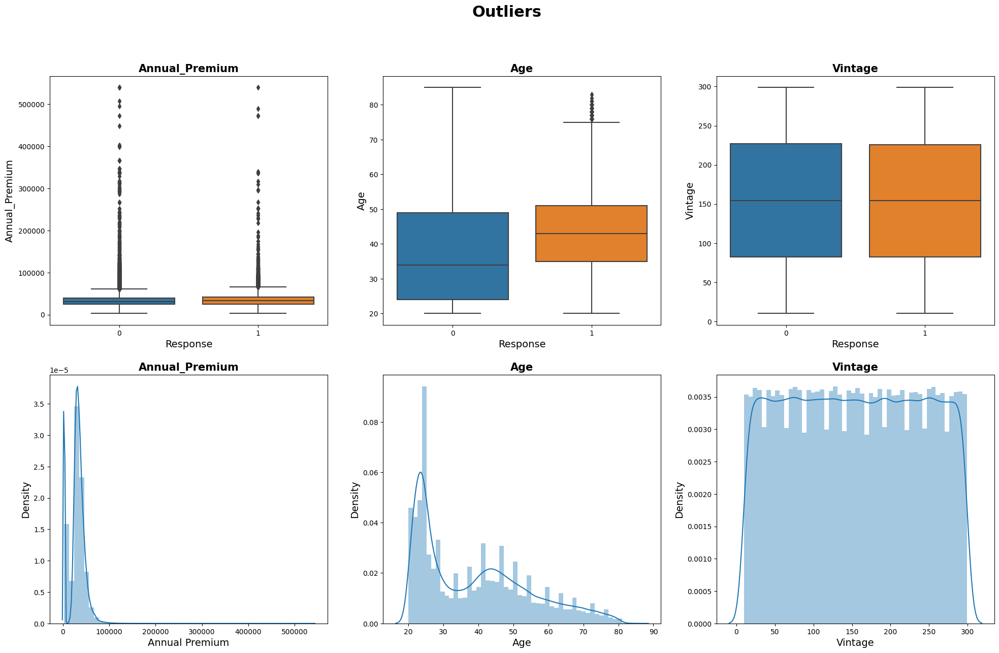

In [ ]:
   def show_outliers(ds):

    fig, axes = plt.subplots(2, 3, figsize=(24,14))

    sns.boxplot(ax = axes[0][0],y = 'Annual_Premium',x = 'Response', data = ds)
    axes[0][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Annual_Premium', fontdict={'fontsize': 14})
    axes[0][0].set_title('Annual_Premium', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.boxplot(ax = axes[0][1],y = 'Age',x = 'Response', data = ds)
    axes[0][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Age', fontdict={'fontsize': 14})
    axes[0][1].set_title('Age', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.boxplot(ax = axes[0][2],y = 'Vintage',x = 'Response', data = ds)
    axes[0][2].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Vintage', fontdict={'fontsize': 14})
    axes[0][2].set_title('Vintage', fontdict={'fontsize': 15,  'fontweight' :'bold'})


    sns.distplot(ax = axes[1][0],x = ds['Annual_Premium'])
    axes[1][0].set_xlabel(xlabel = 'Annual Premium', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1][0].set_title('Annual_Premium', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.distplot(ax = axes[1][1],x = ds['Age'])
    axes[1][1].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1][1].set_title('Age', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.distplot(ax = axes[1][2],x = ds['Vintage'])
    axes[1][2].set_xlabel(xlabel = 'Vintage', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1][2].set_title('Vintage', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    plt.suptitle('Outliers', fontsize = 22, fontweight = 'bold' )

show_outliers(dataset)

* The above graphic suggests that the distribution of the annual premium is positively biased.

* We can also see that Vintage has a rather approximately distribution from above.

* There are some outliers in the age columns, but we won't deal with them because they won't have an impact on the outcome.

# **Treatment of outliers and Scalling of features**

* We will use the quantile method to address outliers.
* We will apply the MinMaxScaler technique for normalization to feature scaling.

In [ ]:
def outlier_treatment(ds):
    Q1=dataset['Annual_Premium'].quantile(0.25)
    Q3=dataset['Annual_Premium'].quantile(0.75)
    IQR=Q3-Q1

    Lower_Whisker = Q1-1.5*IQR
    Upper_Whisker = Q3+1.5*IQR
    dataset['Annual_Premium_Treated'] = np.where(dataset['Annual_Premium']>Upper_Whisker, Upper_Whisker, dataset['Annual_Premium'])

def scale_features(ds):
    scaler = MinMaxScaler()

    dataset['Annual_Premium_Treated'] = scaler.fit_transform(dataset['Annual_Premium_Treated'].values.reshape(-1,1))
    dataset['Vintage_Treated'] = scaler.fit_transform(dataset['Vintage'].values.reshape(-1,1))

outlier_treatment(dataset)
scale_features(dataset)

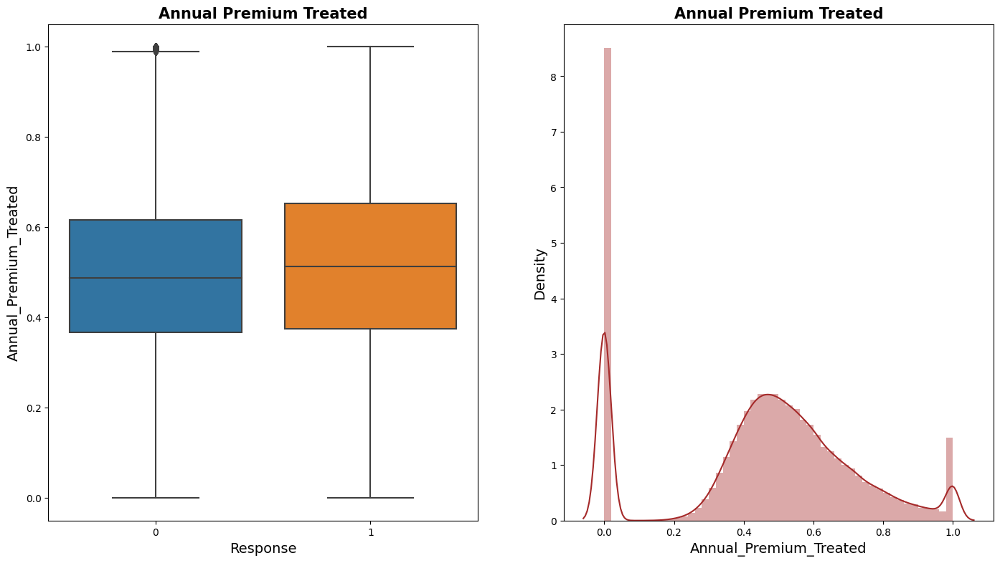

In [ ]:
def show_ann_prem_outliers(ds):

    fig, axes = plt.subplots(1, 2, figsize=(17,9))
    sns.boxplot(ax = axes[0], y = 'Annual_Premium_Treated',x = 'Response', data = ds)
    axes[0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0].set_title('Annual Premium Treated', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.distplot(ax = axes[1], x = ds['Annual_Premium_Treated'], color='brown')
    axes[1].set_xlabel(xlabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1].set_title('Annual Premium Treated', fontdict={'fontsize': 15,  'fontweight' :'bold'})


show_ann_prem_outliers(dataset)

* We can see from the above plots that the Annual Premium has no more outliers

# **Exploratory Data Analysis**

In [ ]:
def show_distribution_numerical_features(ds):
    fig, axes = plt.subplots(2,2, figsize=(22,18))

    sns.countplot(ax = axes[0][0],x = 'Age', data = ds, hue='Response')
    axes[0][0].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 12})
    axes[0][0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 12})
    axes[0][0].set_title('Age', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.countplot(ax = axes[0][1],x = 'Region_Code', data = ds, hue='Response')
    axes[0][1].set_xlabel(xlabel = 'Region_Code', fontdict={'fontsize': 12})
    axes[0][1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 12})
    axes[0][1].set_title('Region_Code',fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.countplot(ax = axes[1][0],x = 'Policy_Sales_Channel', data = ds, hue='Response')
    axes[1][0].set_xlabel(xlabel = 'Policy_Sales_Channel', fontdict={'fontsize': 12})
    axes[1][0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 12})
    axes[1][0].set_title('Policy_Sales_Channel',fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.histplot(ax = axes[1][1], x = dataset['Vintage'],data = ds, hue='Response')
    axes[1][1].set_xlabel(xlabel = 'Vintage', fontdict={'fontsize': 12})
    axes[1][1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 12})
    axes[1][1].set_title('Vintage',fontdict={'fontsize': 15,  'fontweight' :'bold'})

    plt.suptitle('Distribution of Numerical Features', fontsize = 24, fontweight = 'bold' )

In [ ]:
def show_violin_distribution(ds):

    sns.catplot(y = 'Age', data = ds, x='Response', kind = 'violin')
    plt.xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Age', fontdict={'fontsize': 14})
    plt.title('Age Distribution', fontdict={'fontsize': 20, 'fontweight':'bold'})

    sns.catplot(y = 'Region_Code', data = ds, x='Response', kind = 'violin')
    plt.xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Region_Code', fontdict={'fontsize': 14})
    plt.title('Region Code Distribution', fontdict={'fontsize': 20, 'fontweight':'bold'})

    sns.catplot(y = 'Policy_Sales_Channel', data = ds, x='Response', kind = 'violin')
    plt.xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Policy_Sales_Channel', fontdict={'fontsize': 14})
    plt.title('Policy Sales Channel Distribution', fontdict={'fontsize': 20, 'fontweight':'bold'})

In [ ]:
def convert_numerical_to_categorical(ds):
    # Categorizing Age feature
    ds['Age_Group'] = ds['Age'].apply(lambda x:'YoungAge' if x >= 20 and x<=45 else 'MiddleAge' if x>45 and x<=65 else 'OldAge')

    # Categorizing Policy_Sales_Channel feature
    x = ds['Policy_Sales_Channel'].value_counts().apply(lambda x: 'Channel_A' if x>100000 else 'Channel_B' if 74000<x<100000 else 'Channel_C' if 10000<x<=74000 else 'Channel_D')
    res = dict(zip(x.keys(),x.values))
    ds['Policy_Sales_Channel_Categorical'] = ds['Policy_Sales_Channel'].map(res)

    # Categorizing Region Code feature
    x = ds['Region_Code'].value_counts().apply(lambda x: 'Region_A' if x>100000 else 'Region_B' if x>11000 and x<340000 else 'Region_C')
    res = dict(zip(x.keys(),x.values))
    ds['Region_Code_Categorical'] = ds['Region_Code'].map(res)
    # df.Region_Code_Categorical.value_counts()

convert_numerical_to_categorical(dataset)

In [ ]:
def show_distribution_num_to_cat(ds):
    fig, axes = plt.subplots(1,3, figsize=(22,8))

    sns.countplot(ax = axes[0],x = 'Age_Group', data = ds, hue='Response')
    axes[0].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0].set_title('Age', fontdict={'fontsize': 15})

    sns.countplot(ax = axes[1],x = 'Region_Code_Categorical', data = ds, hue='Response')
    axes[1].set_xlabel(xlabel = 'Region_Code_Categorical', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1].set_title('Region_Code',fontdict={'fontsize': 15})

    sns.countplot(ax = axes[2],x = 'Policy_Sales_Channel_Categorical', data = ds, hue='Response')
    axes[2].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[2].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[2].set_title('Policy_Sales_Channel',fontdict={'fontsize': 15})

    plt.suptitle('Distribution of Categorical Features', fontsize = 22, fontweight = 'bold' )

In [ ]:
def show_gender_response_relation(ds):
    sns.catplot(x="Response", hue="Gender", kind="count",
                palette="pastel",
                data=ds)
    plt.xlabel('Response', fontdict={'fontsize':15})
    plt.ylabel('Count',fontdict={'fontsize': 16})
    plt.title('Response V/S Gender', fontdict={'fontsize': 18, 'fontweight':'bold'})

In [ ]:
def show_age_relations(ds):
    fig, axes = plt.subplots(1,3, figsize=(27,9))
    sns.countplot(ax = axes[0],x="Response", hue="Age_Group", palette="pastel",
            data=ds)
    axes[0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0].set_title('Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.histplot(ax = axes[1],binwidth=0.5, x="Age_Group",
                 hue="Previously_Insured", data=ds,
                 stat="count", multiple="stack")
    axes[1].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1].set_title('Age_Group V/S Previously_Insured', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.lineplot(ax = axes[2], x="Age",y="Annual_Premium_Treated",
                 data=ds,hue="Gender")
    axes[2].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 14})
    axes[2].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[2].set_title('Age V/S Annual Premium Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def vehicle_damage_distribution(ds):
    fig = px.pie(ds, values='Response', names='Vehicle_Damage', title='Vehicle Damage Distribution')
    fig.show()

In [ ]:
def show_vehicle_damage_relations(ds):
    fig, axes = plt.subplots(1,2, figsize=(24,9))
    sns.pointplot(ax = axes[0], x="Vehicle_Damage", y="Response", hue="Vehicle_Age",
             data=ds)
    axes[0].set_xlabel(xlabel = 'Vehicle_Damage', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0].set_title('Vehicle_Damage V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(x = 'Vehicle_Damage', y = 'Annual_Premium_Treated', data=ds)
    axes[1].set_xlabel(xlabel = 'Vehicle_Damage', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1].set_title('Vehicle_Damage V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def vehicle_age_distribution(ds):
    plt.figure(figsize=(12, 9))
    sns.countplot(x = 'Vehicle_Age', hue='Response', data = ds, palette="Dark2")
    plt.xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    plt.title('Vehicle_Age', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def show_vehicle_age_relation(ds):
    fig, axes = plt.subplots(2,3, figsize=(22,15))

    sns.barplot(ax = axes[0][0], x = 'Vehicle_Age', y='Response', data = ds)
    axes[0][0].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[0][1], y = 'Response', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data=ds)
    axes[0][1].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[0][2], y = 'Response', x = 'Vehicle_Age', hue = 'Region_Code_Categorical', data=ds)
    axes[0][2].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][2].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[1][0], y = 'Response', x = 'Vehicle_Age', hue = 'Policy_Sales_Channel_Categorical', data=ds )
    axes[1][0].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][0].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})
    sns.boxplot(ax = axes[1][1], y = 'Annual_Premium_Treated', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data=ds)
    axes[1][1].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][1].set_title('Vehicle_Age V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.stripplot(ax = axes[1][2], y = 'Annual_Premium_Treated', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data=ds)
    axes[1][2].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][2].set_title('Vehicle_Age V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def show_annual_premium_relation(ds):
    fig, axes = plt.subplots(2,2, figsize=(18,14))

    sns.pointplot(ax = axes[0][0], x = 'Response', y = 'Annual_Premium_Treated', data = ds)
    axes[0][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][0].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.violinplot(ax = axes[0][1], x = 'Response', y = 'Annual_Premium_Treated', data = ds)
    axes[0][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][1].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.swarmplot(ax = axes[1][0], x = 'Response', y = 'Annual_Premium_Treated', data = ds[:1000])
    axes[1][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][0].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.stripplot(ax = axes[1][1], x = 'Response', y = 'Annual_Premium_Treated', data = ds)
    axes[1][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][1].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def show_annual_premium_with_age_group(ds):
    fig, axes = plt.subplots(1,2, figsize=(15,8))

    sns.barplot(ax = axes[0],y = 'Annual_Premium_Treated', x = 'Age_Group', data= dataset)
    axes[0].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0].set_title('Annual_Premium_Treated V/S Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.violinplot(ax = axes[1], y = 'Annual_Premium_Treated', x = 'Age_Group', data= ds)
    axes[1].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1].set_title('Annual_Premium_Treated V/S Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def show_age_annual_premium_relation(ds):

    plt.figure(figsize = (16,9))
    plt.hexbin(data=dataset, x='Age',y='Annual_Premium_Treated',gridsize = 30, cmap ='Greens')
    plt.title('Annual Premium V/S Age', fontdict={'fontsize': 15, 'fontweight':'bold'})
    plt.ylabel('Annual Premium Treated',fontdict={'fontsize': 14})
    plt.xlabel('Age', fontdict={'fontsize': 14})
    plt.show()


    fig = px.scatter(ds, x="Age", y="Annual_Premium",
                    color="Region_Code_Categorical",
                    size_max=180,opacity=0.3, title='Age V/S Annual Premium')
    fig.show()


In [ ]:
def age_group_distribution(ds):
    fig, axes = plt.subplots(1,3, figsize=(17,9))

    colors = sns.color_palette('pastel')[0:4]
    explode = (0.01, 0.25, 0.01)
    axes[0].pie( x= ds.groupby('Age_Group')['Response'].sum(),explode=explode,
            labels=ds['Age_Group'].unique(), colors=colors, autopct='%1.1f%%',
            shadow=True);
    axes[0].set_title('with Response', fontsize = 15, fontweight ='bold', pad=15)

    axes[1].pie(x=ds.groupby('Age_Group')['Annual_Premium'].sum(),explode=explode,
            labels=ds['Age_Group'].unique(), colors=colors, autopct='%1.1f%%',
            shadow=True);
    axes[1].set_title('with Annual_Premium', fontsize = 15, fontweight ='bold', pad=15)

    axes[2].pie(x=ds.groupby('Age_Group')['Previously_Insured'].sum(),explode=explode,
            labels=ds['Age_Group'].unique(), colors=colors, autopct='%1.1f%%',
            shadow=True);
    axes[2].set_title('with Previously_Insured', fontsize = 15, fontweight ='bold', pad=15)

    plt.suptitle('Age Group Distribution',fontsize = 20, fontweight ='bold')

In [ ]:
def show_region_code_distribution(ds):

    colors = sns.color_palette('pastel')[0:4]
    explode = (0.01, 0.01, 0.01)

    fig, axes = plt.subplots(1,2, figsize=(15,6))
    axes[0].pie(x=ds.groupby('Region_Code_Categorical')['Vintage'].sum(),explode=explode,
                labels=dataset['Region_Code_Categorical'].unique(), colors=colors,autopct='%1.1f%%',
                shadow=True);
    axes[0].set_title('with Vintage', fontsize = 15, fontweight ='bold', pad=15)

    axes[1].pie(x=ds.groupby('Region_Code_Categorical')['Annual_Premium_Treated'].sum(),explode=explode,
                labels=dataset['Region_Code_Categorical'].unique(), colors=colors, autopct='%1.1f%%',
                shadow=True);
    axes[1].set_title('with Annual_Premium', fontsize = 15, fontweight ='bold', pad=15)

    plt.suptitle('Region Code Distribution',fontsize = 15, fontweight ='bold')


In [ ]:
def show_policy_sales_channel_relation(ds):

    fig, axes = plt.subplots(2,3, figsize=(22,15))

    sns.pointplot(ax = axes[0][0], x='Policy_Sales_Channel_Categorical', y='Vintage',data=ds)
    axes[0][0].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Vintage', fontdict={'fontsize': 14})
    axes[0][0].set_title('Policy_Sales_Channel V/S Vintage',
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[0][1], x='Policy_Sales_Channel_Categorical', y='Annual_Premium_Treated',data=ds)
    axes[0][1].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][1].set_title('Policy_Sales_Channel V/S Annual_Premium_Treated',
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

    ds['Policy_Sales_Channel_Categorical'].value_counts().plot(ax = axes[0][2] ,kind='barh')
    axes[0][2].set_xlabel(xlabel = 'Count', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[0][2].set_title('Policy_Sales_Channel', fontdict={'fontsize': 15, 'fontweight':'bold'})


    sns.histplot(ax = axes[1][0],x="Policy_Sales_Channel_Categorical", hue="Response", data=ds, stat="count",
                 multiple="stack",binwidth=0.5)
    axes[1][0].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1][0].set_title('Policy_Sales_Channel', fontdict={'fontsize': 15, 'fontweight':'bold'})

    groupPolicySalesBySum=ds.groupby(by=["Policy_Sales_Channel_Categorical"]).sum().reset_index()
    sns.barplot(ax = axes[1][1], x="Policy_Sales_Channel_Categorical", y="Response", data=groupPolicySalesBySum)
    axes[1][1].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][1].set_title('Policy_Sales_Channel V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})


    sns.barplot(ax = axes[1][2], x='Policy_Sales_Channel_Categorical', y='Response', data=ds, hue='Region_Code_Categorical')
    axes[1][2].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][2].set_title('Policy_Sales_Channel V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def count_each_categorical_feature(ds):
    categorical_columns = ['Gender', 'Age_Group', 'Region_Code_Categorical', 'Previously_Insured', 'Vehicle_Age','Vehicle_Damage', 'Policy_Sales_Channel_Categorical']

    fig, axes =  plt.subplots(2, 7, figsize=(45, 15))
    for i in range(7):
        sns.countplot(data = ds[ds['Response']==1], x=categorical_columns[i], ax=axes[0][i])
        axes[0][i].set_xlabel(xlabel = categorical_columns[i], fontdict={'fontsize': 14})
        axes[0][i].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
        axes[0][i].set_title(categorical_columns[i],
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

        sns.countplot(data = ds[ds['Response']==0], x=categorical_columns[i], ax=axes[1][i])

        axes[1][i].set_xlabel(xlabel = categorical_columns[i], fontdict={'fontsize': 14})
        axes[1][i].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
        axes[1][i].set_title(categorical_columns[i],
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

# **Exploring the numerical feature**

We have four numerical features: Vintage, Region_Code, Policy_Sales_Channel, and Age. Let's explore these features without further ado.

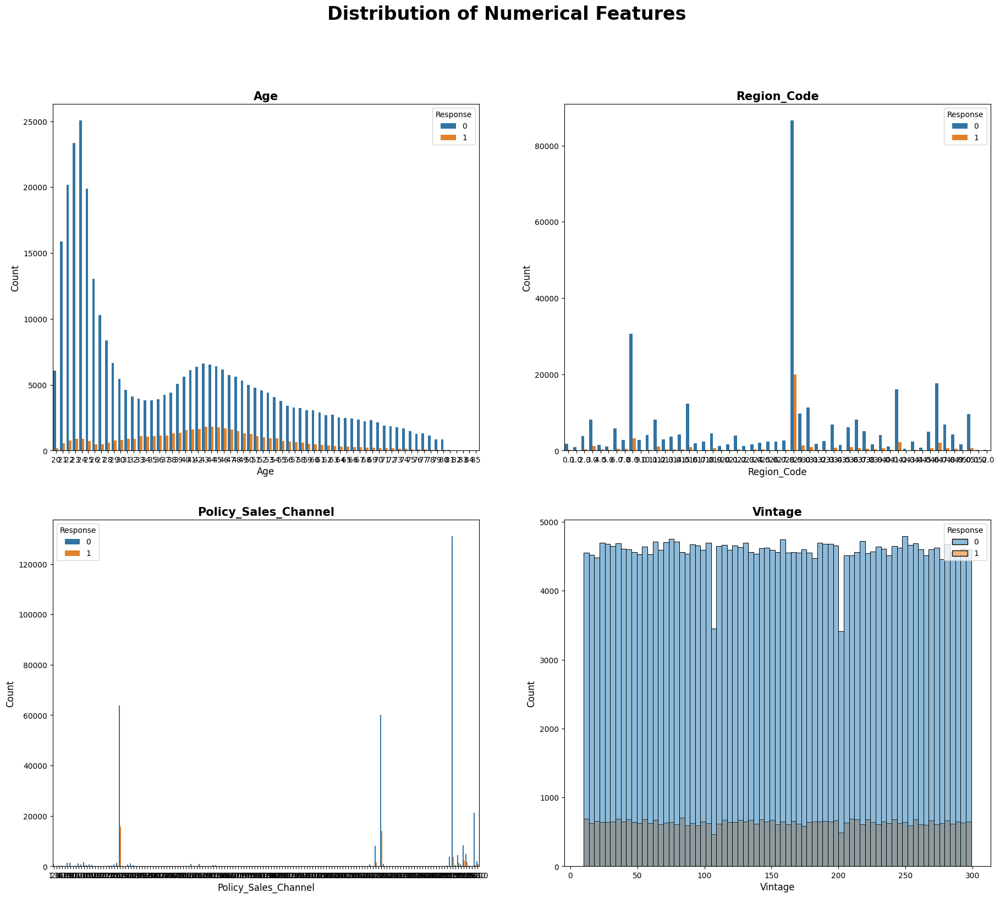

In [ ]:
show_distribution_numerical_features(dataset)

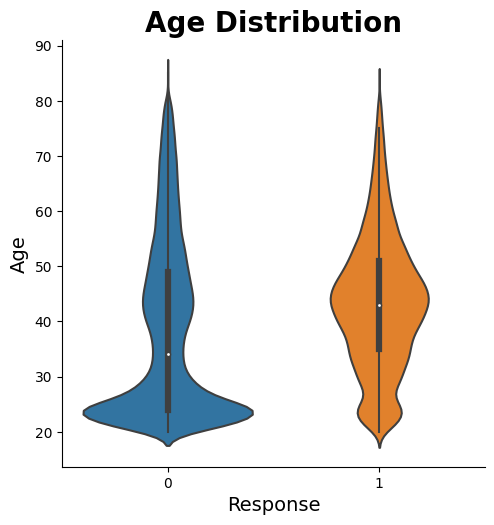

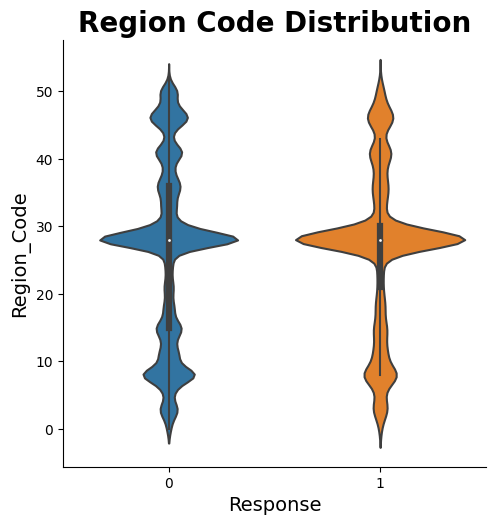

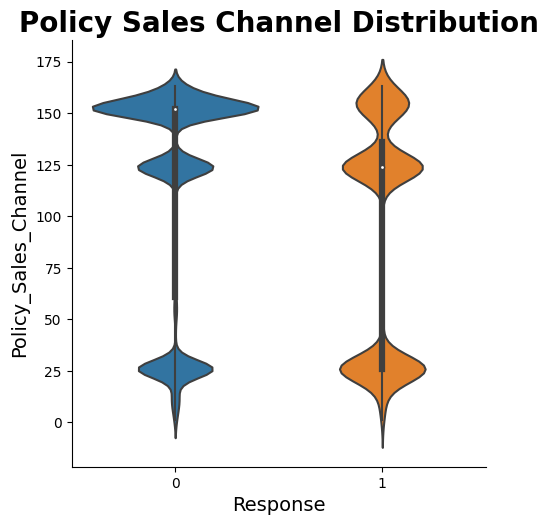

In [ ]:
show_violin_distribution(dataset)

# **From the above graphical representation, we can draw the following conclusions:**

* As we can see, there is a great deal of data dispersion in the Age feature, so we can divide it into categories like YoungAge, MiddleAge, and OldAge to acquire better insights.

* The categories for Region Code and Policy_Sales_Channel are same.

# **Converting Numerical columns to Categorical**

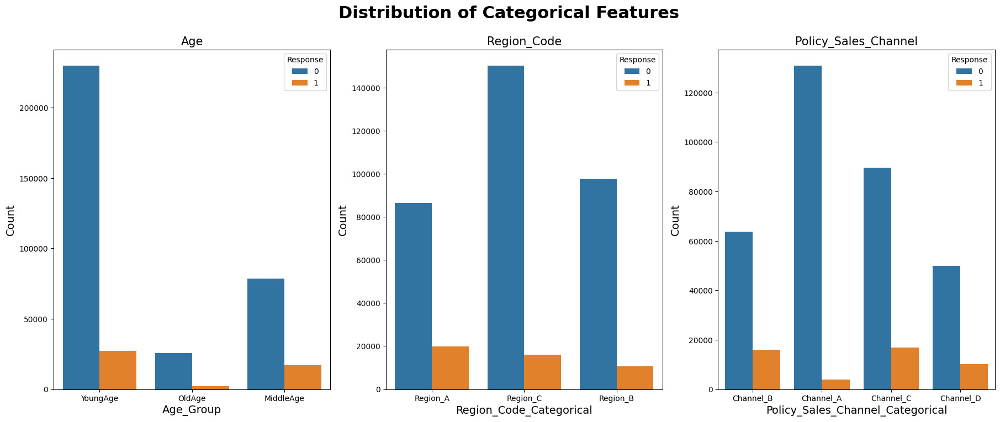

In [ ]:
show_distribution_num_to_cat(dataset)

### **Observations:**

* We can tell that YoungAge group customers are less likely to be interested in purchasing vehicle insurance.

* Similar to this, customers from Region_C and Channel_A had the highest likelihood of forgoing vehicle insurance.

In [ ]:
dataset.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Annual_Premium_Treated,Vintage_Treated,Age_Group,Policy_Sales_Channel_Categorical,Region_Code_Categorical
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1,0.638245,0.716263,YoungAge,Channel_B,Region_A
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0,0.521510,0.598616,OldAge,Channel_B,Region_C
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1,0.601797,0.058824,MiddleAge,Channel_B,Region_A
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0,0.438540,0.667820,YoungAge,Channel_A,Region_C
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0,0.419591,0.100346,YoungAge,Channel_A,Region_B


### **Gender Distribution**

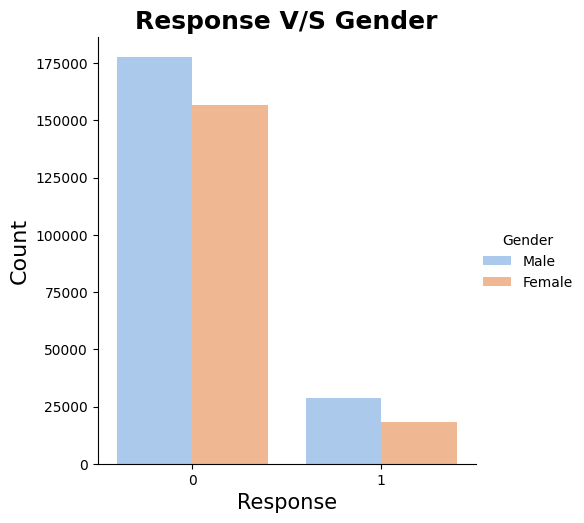

In [ ]:
show_gender_response_relation(dataset)

* According to the above plot we can say that, there are more male customers in our data set than female customers.

### **Exploring the Age Feature**

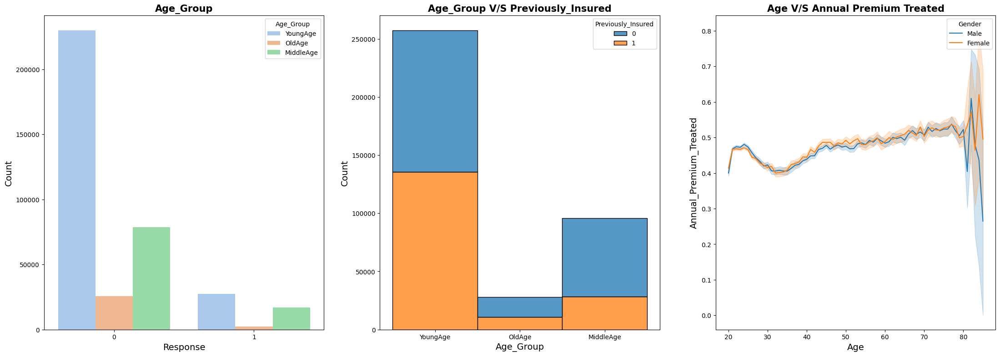

In [ ]:
show_age_relations(dataset)

### **Observation:**

* We can see the Responses from the different Age_Groups from the first figure.

* The second graph displays the percentage of customers in each age group who have or do not have auto insurance.

* We can state that consumers in the YoungAge and OldAge age groups are equally likely to have or not have auto insurance, however customers in the MiddleAge group have the highest odds of not having had auto insurance in the past.

* The third plot shows how the annual_premium for both male and female clients is correlated with their age.

# **Exploring Vehicle Damage**

In [ ]:
vehicle_damage_distribution(dataset)

In [ ]:
!pip uninstall scikit-learn -y
!pip install -U scikit-learn

Found existing installation: scikit-learn 1.2.2
Uninstalling scikit-learn-1.2.2:
  Successfully uninstalled scikit-learn-1.2.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 37.1 MB/s eta 0:00:00


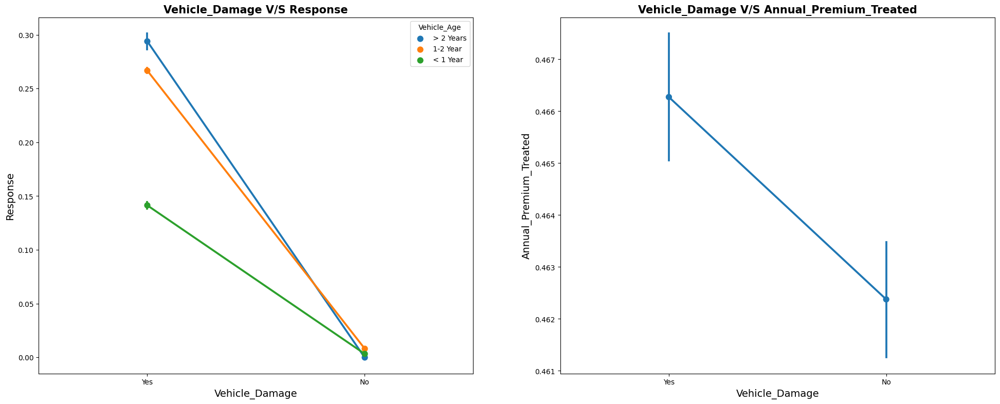

In [ ]:
show_vehicle_damage_relations(dataset)

# **Observations:**

* The percentage of clients who took the insurance and had damaged or undamaged vehicles is depicted in a pie chart.

* From the first point plot, regardless of the vehicle age group, there is a higher likelihood that you will purchase auto insurance if your vehicle is damaged. The likelihood of purchasing auto insurance rises as vehicle age increases.

* According to the second point plot, consumers with damaged vehicles pay a comparably higher Annual_Premium.

## **Exploring Vehicle Age Feature**

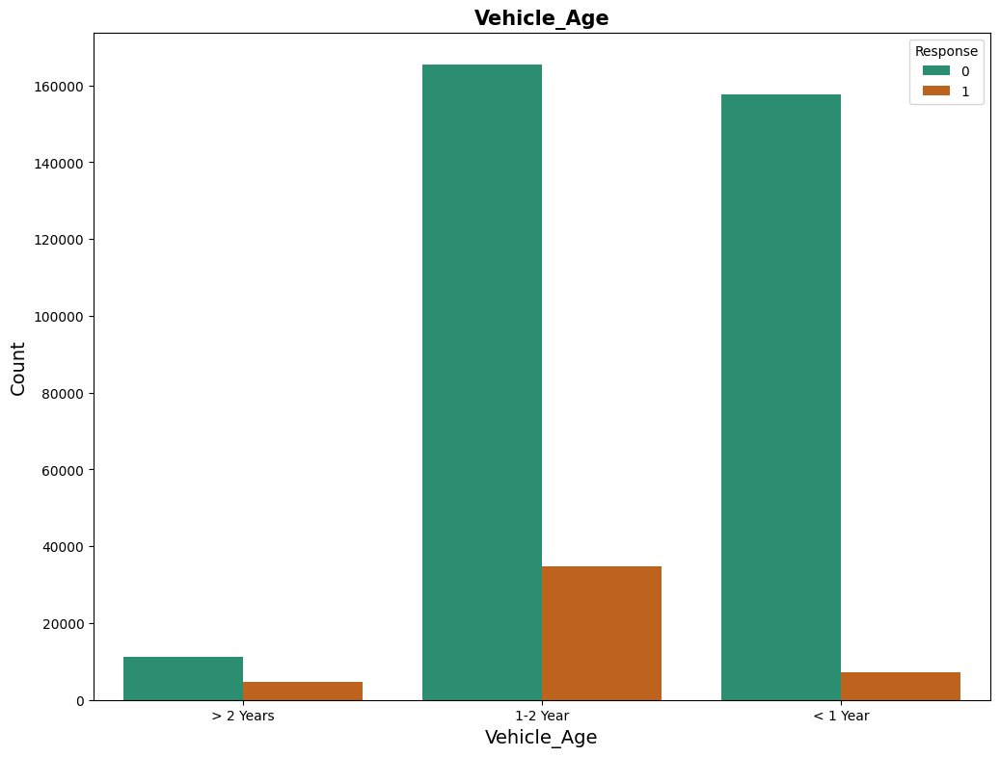

In [ ]:
vehicle_age_distribution(dataset)

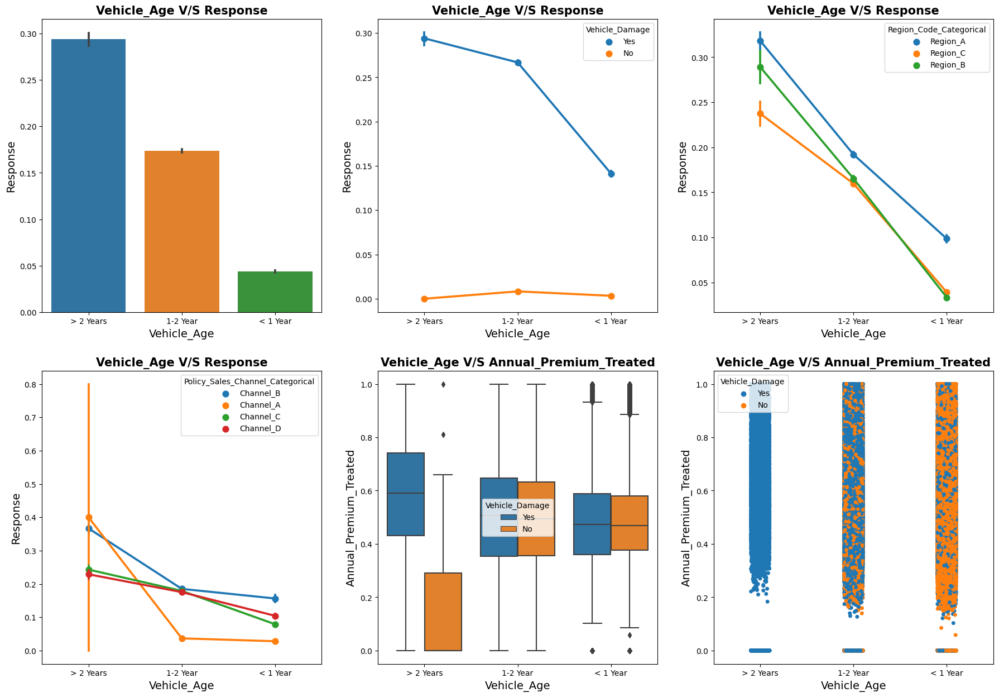

In [ ]:
show_vehicle_age_relation(dataset)

### **Observation:**

* The first bar plot shows how many members of the VehicleAge group purchased or declined vehicle insurance.

* The possibility of purchasing vehicle insurance for a specific VehicleAge group is shown in the first two plots of the grid above.

* In the third plot of the grid above, it is possible to purchase vehicle insurance for a certain VehicleAge group of vehicles based on their RegionCode.

* The fourth plot in the grid above illustrates the option of purchasing vehicle insurance for a specific VehicleAge group based on their PolicySalesChannel group.

* From the box plot of the above grid, we can notice the relation of Vehicle_Age group and Annual_Premium based on their Vehicle_Damage response.

* The strip plot demonstrates that the customers having vehicle age >2 Years have the higher chances of taking vehicle insurance.

## **Exploring Annual Premium**

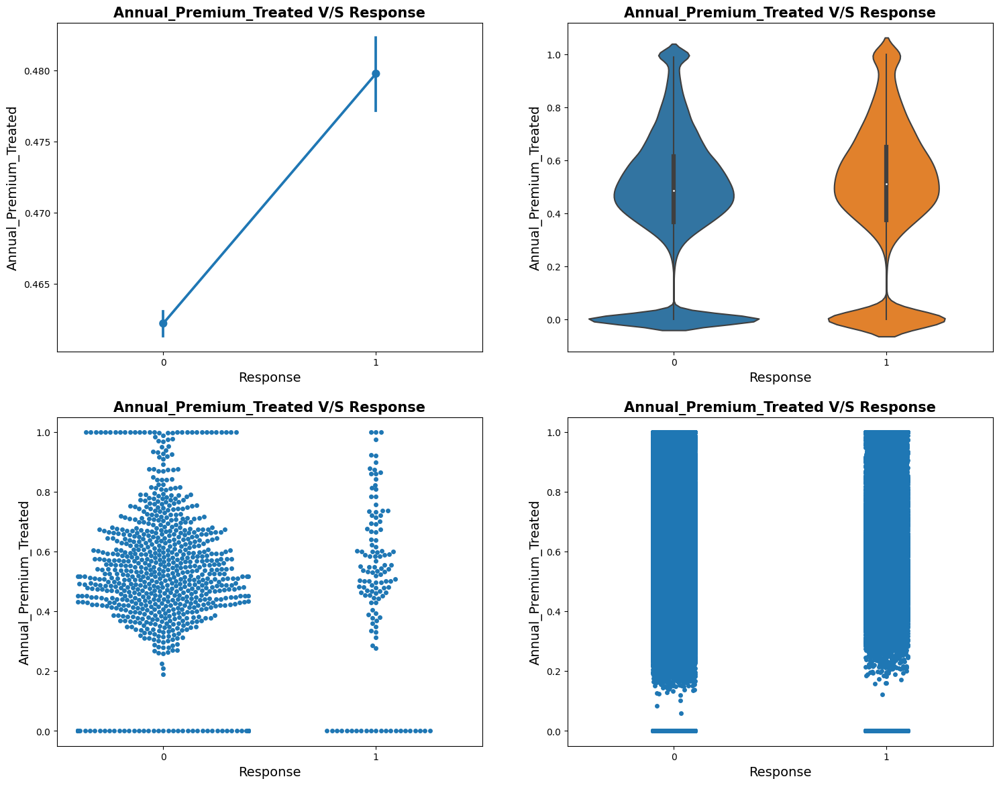

In [ ]:
show_annual_premium_relation(dataset)

### **Observations:**

* We can say from the point plot that people are more likely to purchase vehicle insurance if the Annual_Premium is higher.

* The violin plot's second plot shows the same thing as well.

* Third plot shows the plattern of responses based on the Annual_Premium.

* Fourth plot is the strip plot for Annual_Premium and Responses

## **Annual Premium and Age**

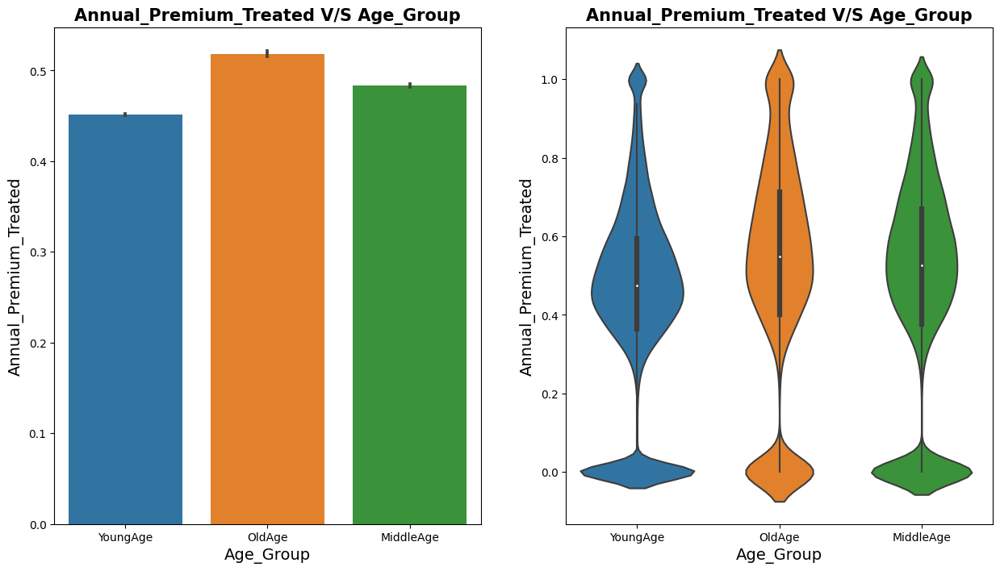

In [ ]:
show_annual_premium_with_age_group(dataset)

* The distribution of the annual premium on the basis of age group is depicted in the two plots above, the bar and the violin.

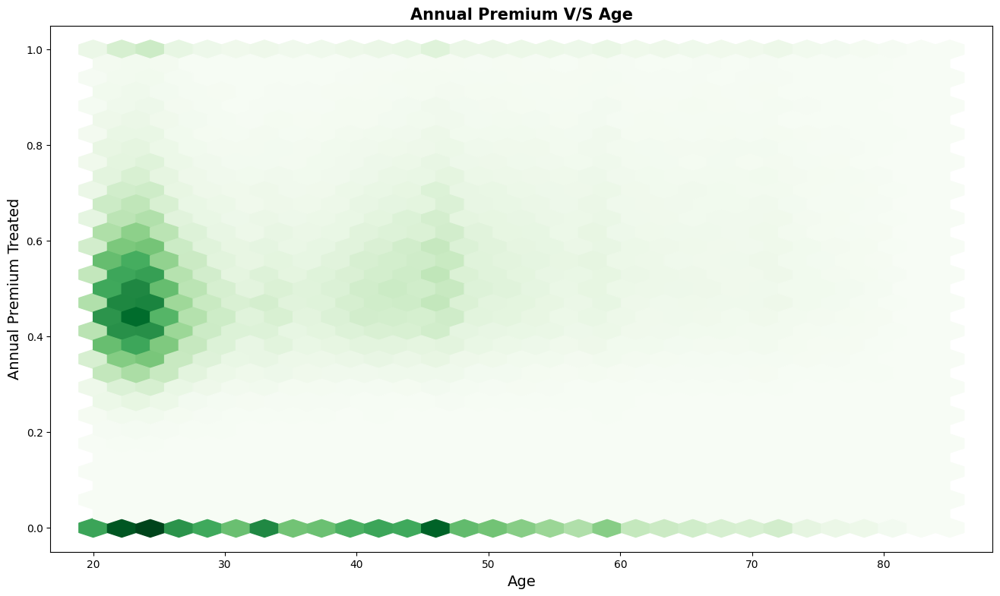

In [ ]:
show_age_annual_premium_relation(dataset)

# **Observations:**

* The first plot shows each person's Annual_Premium according to age.

* The identical data points are displayed in the second plot, but they are categorized by Region_Code.

## **Age Group**

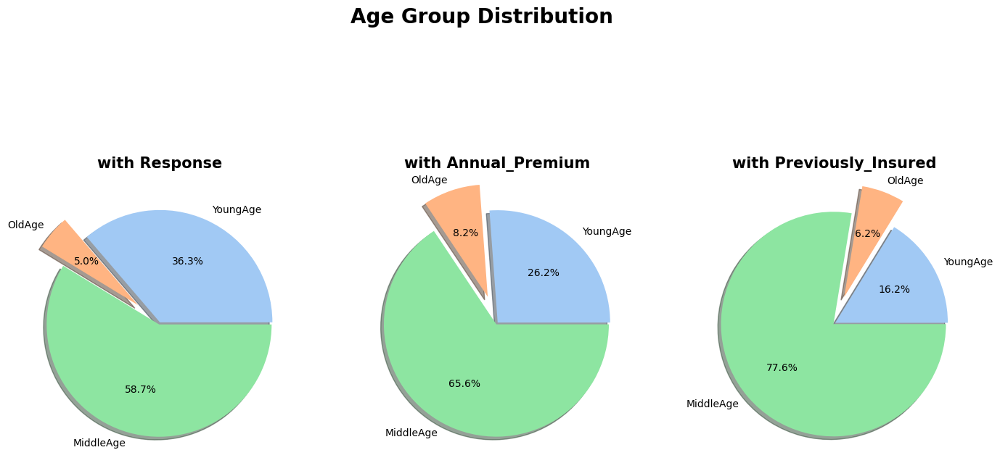

In [ ]:
age_group_distribution(dataset)

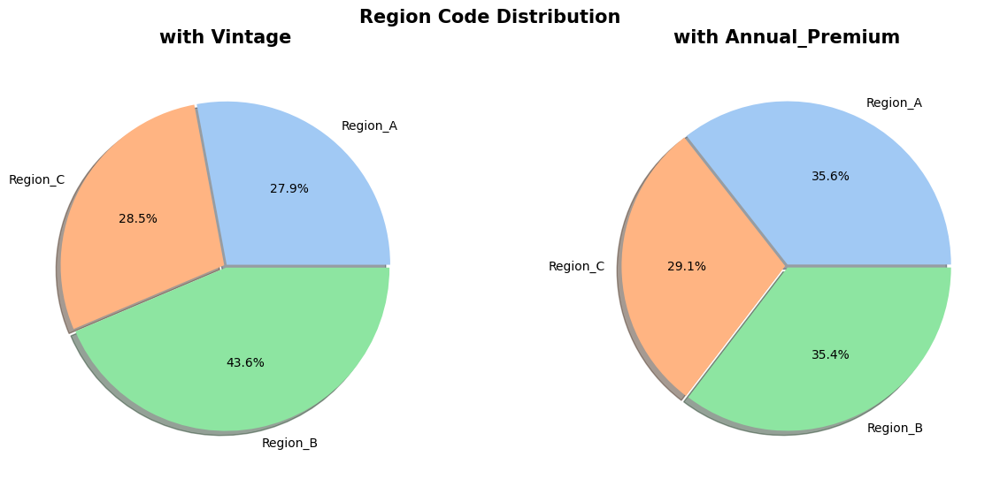

In [ ]:
show_region_code_distribution(dataset)

### **Observations:**

* The distribution of Age_Group in the Data set based on Response, Annual_Premium, and Previously_Insured is shown in the above three pie graphs up top.

* Based on Vintage and Annual_Premium, the two pie plots up above shows how Region_Code is distributed throughout the data set.

## **Exploring Policy Sales Channel**

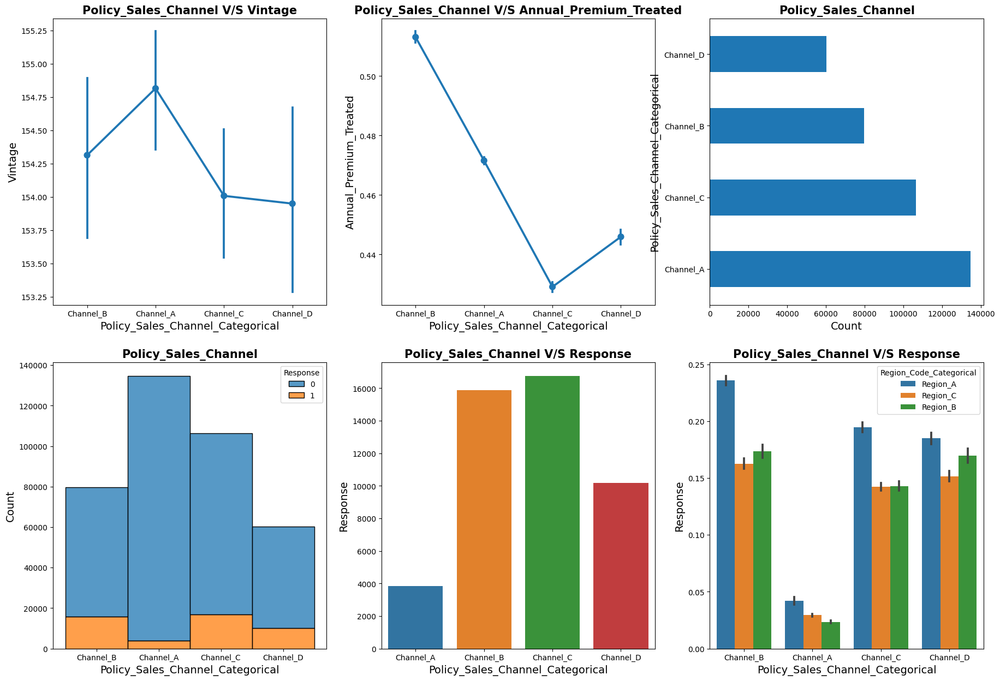

In [ ]:
show_policy_sales_channel_relation(dataset)

### **Observations:**

* The distribution of Policy_Sales_Channel based on Vintage and Annual_Premium_Treated is shown in the two point plot graphs.

* Based on responses,the next three bar plots shows the number of data points belonging to a particular channel.

* The last bar plot displays, based on Policy_Sales_Channel and Region_Code, the likelihood that a consumer would purchase auto insurance.

## **Distribution plots based on features**

* The distribution of data points depending on different features is shown in the charts below.

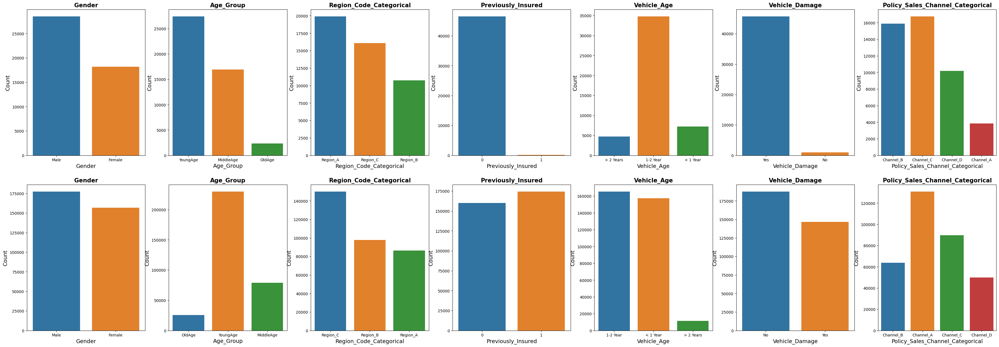

In [ ]:
count_each_categorical_feature(dataset)

## **Dropping Extra columns**

* Age, Region Code, Annual Premium, Policy Sales Channel, and Vintage features can now be drop because we have previously classified them in our data set.

* 'ID' and 'Driving_License' can also be removed because they don't offer any valuable information.

In [ ]:
dataset.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response', 'Annual_Premium_Treated',
       'Vintage_Treated', 'Age_Group', 'Policy_Sales_Channel_Categorical',
       'Region_Code_Categorical'],
      dtype='object')

In [ ]:
# Dropping Unnecessary Columns
cols_to_drop = ['id', 'Age', 'Driving_License',
                'Region_Code', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage']
dataset.drop(columns = cols_to_drop,inplace=True)

# **Feature Selection**

# **Numeric Feature Selection**

Now will see the Kendall's correlation between numerical features.

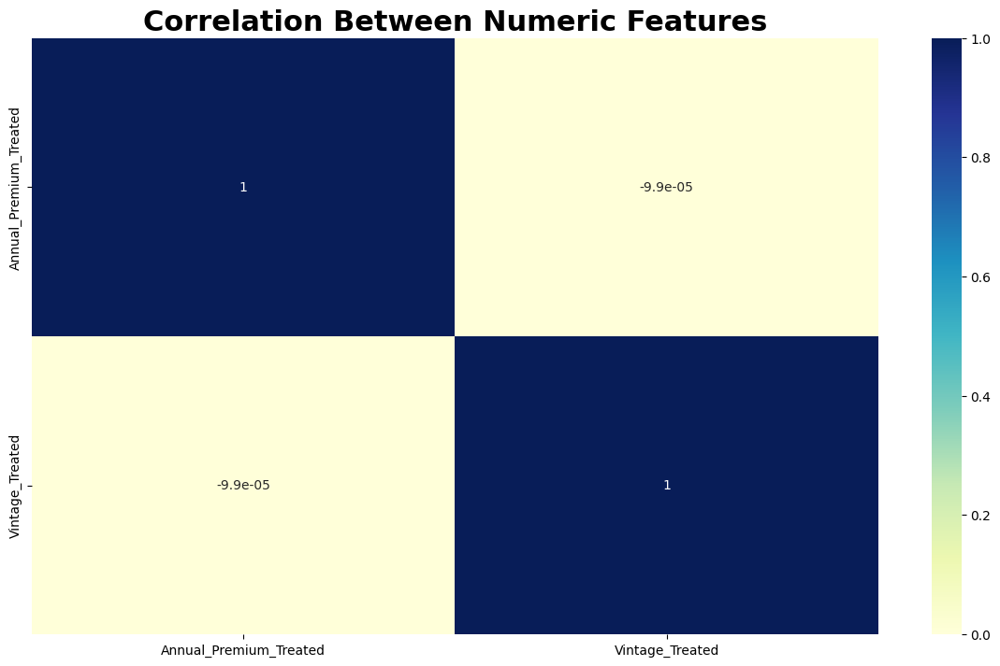

In [ ]:
def numeric_feature_selection(ds):
    plt.rcParams['figure.figsize'] = 14.6,8.29
    numeric_features = ['Annual_Premium_Treated','Vintage_Treated']

    sns.heatmap(ds[numeric_features].corr(method = 'kendall'),
                cmap="YlGnBu",annot=True)
    plt.title('Correlation Between Numeric Features', fontdict={'fontsize':22,'fontweight':'bold'})

numeric_feature_selection(dataset)

In above figure we got two numeric features-Annual_Premium_Treated and Vintage_Treated

* Since there is no connection between these two features,we will proceed with both of them

## **Categorical Features**

Now we will see the categorical importance of these two features

In [ ]:
categorical_features = ['Gender','Age_Group','Region_Code_Categorical','Previously_Insured',
                        'Vehicle_Age','Vehicle_Damage','Policy_Sales_Channel_Categorical']

In [ ]:
def make_features_numeric(ds):
    global numeric_ds
    numeric_ds = ds.copy()
    numeric_ds['Gender'] = numeric_ds['Gender'].apply(lambda x: 1 if x == 'Male' else 0)
    numeric_ds['Age_Group'] = numeric_ds['Age_Group'].apply(lambda x: 1 if x == 'YoungAge' else 2 if x == 'MiddleAge' else 3)
    numeric_ds['Vehicle_Age'] = numeric_ds['Vehicle_Age'].apply(lambda x: 1 if x == 'New' else 2 if x == 'Latest' else 3)
    numeric_ds['Vehicle_Damage'] = numeric_ds['Vehicle_Damage'].apply(lambda x: 0 if x == 'Y' else 1)
    numeric_ds['Policy_Sales_Channel_Categorical'] = numeric_ds['Policy_Sales_Channel_Categorical'].apply(lambda x: 1 if x == 'A' else 2 if x == 'B' else 3 if x=='C' else 4)
    numeric_ds['Region_Code_Categorical'] = numeric_ds['Region_Code_Categorical'].apply(lambda x: 1 if x == 'A' else 2 if x == 'B' else 3)

make_features_numeric(dataset)

## **Mutual Information**

Mutual information measures the amount of information we get from one variable by observing the values of the second variable.

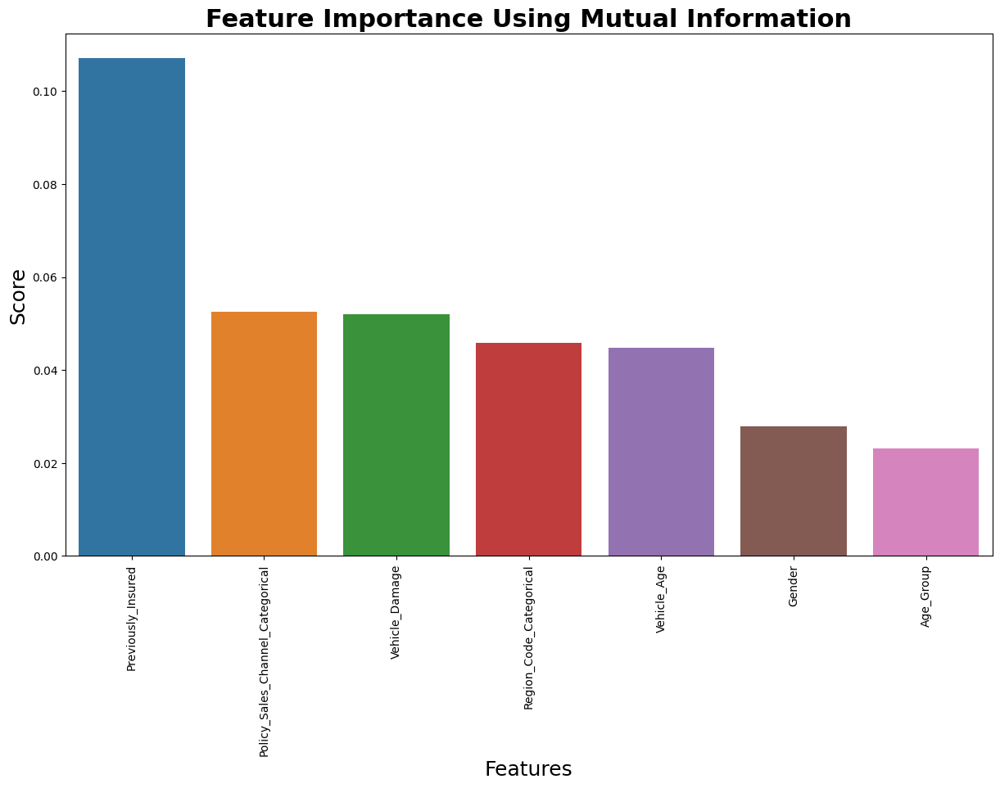

In [ ]:
def mutual_info(ds):
    X = ds.copy()
    y = X.pop("Response")
    X.drop(columns = ['Annual_Premium_Treated','Vintage_Treated'], inplace = True)

    x_train, x_test, y_train, y_test=train_test_split(X,y,test_size=0.3)

    high_score_features = []
    feature_scores = mutual_info_classif( x_train, y_train,  random_state=0)

    column_score = {}
    columns = []
    scores = []
    for score, f_name in sorted(zip(feature_scores, x_train.columns), reverse=True):
        columns.append(f_name)
        scores.append(score)
        high_score_features.append(f_name)

    column_score['Feature'] = columns
    column_score['Score'] = scores

    return pd.DataFrame(data = column_score)

def show_feature_importance_through_mi(ds):
    sns.barplot(data = mutual_info(ds), x = 'Feature', y='Score')
    plt.title('Feature Importance Using Mutual Information',
 fontdict={'fontsize':22,'fontweight':'bold'})
    plt.xlabel('Features', fontdict={'fontsize':18})
    plt.ylabel('Score', fontdict={'fontsize':18})
    plt.xticks(rotation=90)

show_feature_importance_through_mi(numeric_ds)

* According to the above bar plot, Previously_Insured is the most important feature and has the most influence on the dependent feature.

## **One-Hot Encoding**

* One hot encoding method involves converting categorical information into a format that may be given to ML algorithms to help them perform better at prediction.

* We employ one-hot encoding when there is no ordinal link between the variables. The model doesn't assume a natural ordering between categories when using One-Hot Encoding, which could lead to poor performance or unexpected results.

In [ ]:
dataset.columns

Index(['Gender', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage',
       'Response', 'Annual_Premium_Treated', 'Vintage_Treated', 'Age_Group',
       'Policy_Sales_Channel_Categorical', 'Region_Code_Categorical'],
      dtype='object')

In [ ]:
cols_to_encode = ['Gender', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage',
                  'Age_Group','Policy_Sales_Channel_Categorical', 'Region_Code_Categorical']

dataset = pd.get_dummies(data = dataset, columns=cols_to_encode)
dataset.head()

,Response,Annual_Premium_Treated,Vintage_Treated,Gender_Female,Gender_Male,Previously_Insured_0,Previously_Insured_1,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years,...,Age_Group_MiddleAge,Age_Group_OldAge,Age_Group_YoungAge,Policy_Sales_Channel_Categorical_Channel_A,Policy_Sales_Channel_Categorical_Channel_B,Policy_Sales_Channel_Categorical_Channel_C,Policy_Sales_Channel_Categorical_Channel_D,Region_Code_Categorical_Region_A,Region_Code_Categorical_Region_B,Region_Code_Categorical_Region_C
0,1,0.638245,0.716263,0,1,1,0,0,0,1,...,0,0,1,0,1,0,0,1,0,0
1,0,0.521510,0.598616,0,1,1,0,1,0,0,...,0,1,0,0,1,0,0,0,0,1
2,1,0.601797,0.058824,0,1,1,0,0,0,1,...,1,0,0,0,1,0,0,1,0,0
3,0,0.438540,0.667820,0,1,0,1,0,1,0,...,0,0,1,1,0,0,0,0,0,1
4,0,0.419591,0.100346,1,0,0,1,0,1,0,...,0,0,1,1,0,0,0,0,1,0


So, this concludes the dataset's Feature Selection part. Now we will use various machine learning algorithms to train the dataset.

## **Machine Learning Algorithms**

Let's test out different machine learning models on our data set to evaluate how well they do. First, we will adjust the hyper-parameters of those models. Then, depending on elapsed time and evaluation metrics of the best parameters, we will compare and select the best model out of those.

Types of Machine Learning Models we are going to train and evaluate our data set on:

Decision Tree

Gaussian Naive Bayes

AdaBoost Classifier

Bagging Classifier

LightGBM

Logistic Regression

##**Hyperparameter Tunning methods:**

We have tried different hyper-parameter tuning techniques. The models had to be trained for a very long time using GridSearchCV and RandomizedSearchCV, but all methods produced the same results. The model that required the least time to train and predict the results was halvingRandomizedSearchCV. Because of this, we strongly advise that you retain the Tuning_Method selected from the drop-down menu below as Halving_Randomized_Search_CV.

To compare performance, we have also added a few model tweaking results from GridSearchCV and RandomizedSearchCV.

## **Tunning Methods:-**

* HalvingRandomizedSearchCV
* GridSearchCV
* RandomizedSearchCV

## **Evaluation Metrices:-**

* Accuracy Score
* Precision
* Recall
* F1 Score
* ROC AUC Score
* Log Loss

# **Plots:-**

There is a one ROC Curve that displays the ROC Scores and a Parallel Coordinates Plot that displays all the hyper-parameter combinations used to tune the model to obtain the best parameters at the conclusion of hyper-parameter tuning for each model.


In [ ]:
def plot_confusion_matrix_and_roc_curves(model, X_test, y_test, y_pred):

    fig, axes = plt.subplots(1,2, figsize=(22,5))

    cm = confusion_matrix(y_test, y_pred)
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ['{0:0.0f}'.format(value) for value in
                    cm.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in
                        cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
            zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cm, ax = axes[0], annot=labels, fmt='',cmap='Blues')
    axes[0].set_title('Confusion Matrix', fontdict={'fontsize': 16, 'fontweight':'bold'})

    # predict probabilities
    pred_proba = model.predict_proba(X_test)

    # roc curve for models
    fpr, tpr, thresh = roc_curve(y_test, pred_proba[:,1], pos_label=1)

    # roc curve for tpr = fpr
    random_probs = [0 for i in range(len(y_test))]
    p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

    plt.subplot(1, 2, 2)
    # plot roc curves
    plt.plot(fpr, tpr,linestyle='--',color='red', label = type(model).__name__)

    plt.plot(p_fpr, p_tpr, linestyle='-', color='blue')
    # title
    plt.title('ROC curve', fontdict={'fontsize': 16, 'fontweight':'bold'})
    # x label
    plt.xlabel('False Positive Rate', fontdict={'fontsize': 12})
    # y label
    plt.ylabel('True Positive rate', fontdict={'fontsize': 12})

    plt.legend(loc='best')
    plt.show()


def visualization(results_ds, parameters):

    def shorten_param(param_name):
        if "__" in param_name:
            return param_name.rsplit("__", 1)[1]
        return param_name

    column_results = [f"param_{name}" for name in parameters.keys()]
    column_results += ["mean_test_score", "std_test_score", "rank_test_score"]

    results_ds = results_ds[column_results].sort_values("mean_test_score", ascending=False)
    results_ds = results_ds.rename(shorten_param, axis=1)

    for col in results_ds.columns:
        if col == 'param_random_state':
            continue
        try:
            results_ds[col] = results_ds[col].astype(np.float64)
        except:
            continue

    fig = px.parallel_coordinates(
    results_ds,
    color="mean_test_score",
    color_continuous_scale=px.colors.sequential.Viridis,
    title='Hyper Parameter Tuning',)
    fig.show()


def evaluation_metrics(name, independent_feature_length , y_pred, y_test):

    metrics_dict = {}
    metrics_dict['Accuracy_Score'] = [accuracy_score(y_test,y_pred)]  #Accuracy Score
    metrics_dict['Precision'] = [precision_score(y_test,y_pred)] #Precision
    metrics_dict['Recall'] = [recall_score(y_test,y_pred)] #Recall
    metrics_dict['F1_Score'] = [f1_score(y_test,y_pred)] #F1 Score
    metrics_dict['ROC_AUC_Score'] = [roc_auc_score(y_test, y_pred)] #ROC AUC Score
    metrics_dict['Log_Loss'] = [log_loss(y_test, y_pred)] #Log Loss

    metrics_ds = pd.DataFrame(metrics_dict)

    print(metrics_ds)


def hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model):

    if tuning_model == 'Halving_Randomized_Search_CV':
        tuned_model = HalvingRandomSearchCV(model, param_distributions = parameters, scoring = "accuracy", n_jobs=-1, factor=3, cv = 5 )

    elif tuning_model == 'Randomized_Search_CV':
        tuned_model = RandomizedSearchCV(model, param_distributions = parameters, scoring = 'accuracy', cv = 3, n_iter = 50, n_jobs=-1)

    else:
        tuned_mode = GridSearchCV(model, param_grid = parameters, scoring = 'accuracy', n_jobs=-1, cv = 3)


    start_time = time.time()

    tuned_model.fit(x_train, y_train)

    stop_time = time.time()

    print('*****'*10+f'\nBest Score for {type(model).__name__} : {tuned_model.best_score_}','\n---')
    print(f'Best Parameters for {type(model).__name__} : {tuned_model.best_params_}\n'+'-----'*10)

    print('Elapsed Time:',time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
    print('======'*5)

    return tuned_model


def perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, tuning_model):
    print('-----'*10+f'\n{type(model).__name__}\n'+'-----'*10)

    model.fit(x_train, y_train)
    untuned_pred = model.predict(x_test)

    # Evaluation Metrics before tuning
    print(f'\nEvaluation of {type(model).__name__} before tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__, len(list(x_train.columns)), untuned_pred, y_test)

    print()
    plot_confusion_matrix_and_roc_curves(model, x_test, y_test, untuned_pred)

    # Hyper-parameter tuning
    tuned_model = hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model)
    tuned_pred = tuned_model.predict(x_test)

    # Evaluation Metrics after tuning
    print(f'\nEvaluation of {type(model).__name__} after tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__,len(list(x_train.columns)), tuned_pred, y_test)

    print()
    plot_confusion_matrix_and_roc_curves(tuned_model.best_estimator_, x_test, y_test, tuned_pred)
    visualization(pd.DataFrame(tuned_model.cv_results_), parameters)


def ml_algorithm_implementation(ds, model, parameters, tuning_model, feature_importance = False):

    if feature_importance == False:
        print('########'*8+'\n     <<<< '+f'Tuning Model: {tuning_model}'+' >>>>\n'+'********'*8)

    x = dataset.iloc[:,1:]
    y = dataset['Response']

    # Train Test Split
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=57)

    if feature_importance == True:
        model.fit(x_train, y_train)
        return x_train, y_train, model

    perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, tuning_model)

In [ ]:
#@title Keep it Halving_Randomized_Search_CV!! Other methods are time consuming.
Tuning_Method = "Halving_Randomized_Search_CV" #@param ["Halving_Randomized_Search_CV", "Grid_Search_CV", "Randomized_Search_CV"]

## **Decision Tree**

Decision tree is a tool of sypervised learning algorithms used for solving classification and regression tasks.It builds a flowchart like tree structure where each internal node denotes a test on a attribute,each branch represents an outcome of a test, and each leaf node holds a class label.

## **Hyper-Parameter Tuning:**

splitter: The strategy used to choose the split at each node.

max_depth: The maximum depth of the tree.

min_samples_leaf: The minimum number of samples required to be at a leaf node.

min_weight_fraction_leaf: The minimum weighted fraction of the sum total of weights (of all the input samples) required to be at a leaf node.

max_features: The number of features to consider when looking for the best split.

max_leaf_nodes: Grow a tree with max_leaf_nodes in best-first fashion.

random_state: Controls the randomness of the estimator.

In [ ]:
from sklearn.tree import DecisionTreeClassifier

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
DecisionTreeClassifier
--------------------------------------------------

Evaluation of DecisionTreeClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.825142   0.277276  0.270946  0.274074       0.586486  6.302509



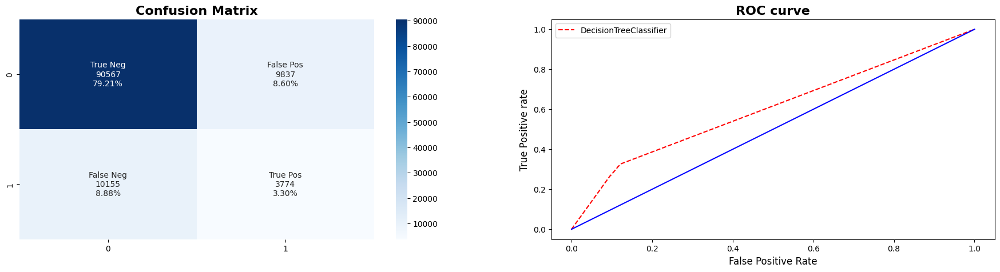

**************************************************
Best Score for DecisionTreeClassifier : 0.8753429760410636 
---
Best Parameters for DecisionTreeClassifier : {'splitter': 'random', 'random_state': 23, 'min_weight_fraction_leaf': 0.5, 'min_samples_leaf': 1, 'max_leaf_nodes': None, 'max_features': 'log2', 'max_depth': None}
--------------------------------------------------
Elapsed Time: 00:03:03

Evaluation of DecisionTreeClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



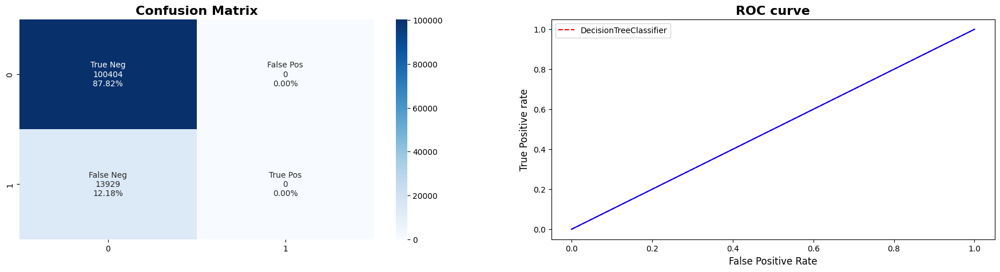

In [ ]:
parameters_decision_tree = {
    "splitter": ["best", "random"],
    "max_depth": [None, 5, 7, 9],
    "min_samples_leaf": [1, 2, 3, 4, 5],
    "min_weight_fraction_leaf": [0.0, 0.3, 0.4, 0.5],
    "max_features": ["auto", "log2", "sqrt", None],
    "max_leaf_nodes": [None, 30, 40, 50, 60],
    'random_state': [23]
}

ml_algorithm_implementation(dataset, DecisionTreeClassifier(), parameters_decision_tree, Tuning_Method, False)

## **Gaussian Naive Bayes**

A variation of Naive Bayes that supports continuous data and follows to the Gaussian normal distribution is called Gaussian Naive Bayes. A class of supervised machine learning classification methods built on the Bayes theorem are known as naive bayes. Although it is a straightforward categorization method, it is highly functional.

## **Hyperparameter Tuning:**

var_smoothing: Portion of the largest variance of all features that is added to variances for calculation stability.

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
GaussianNB
--------------------------------------------------

Evaluation of GaussianNB before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.687571   0.268878  0.910044   0.41511       0.783375   11.2611



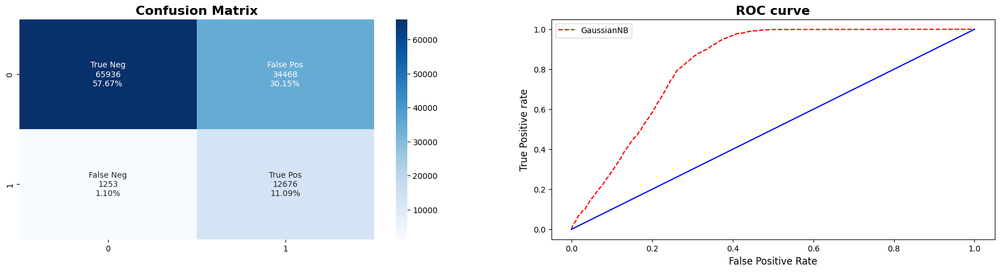

**************************************************
Best Score for GaussianNB : 0.6868956159461835 
---
Best Parameters for GaussianNB : {'var_smoothing': 0.0657933224657568}
--------------------------------------------------
Elapsed Time: 00:00:13

Evaluation of GaussianNB after tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score   Log_Loss
0        0.688296   0.269117  0.908321  0.415214       0.783047  11.234934



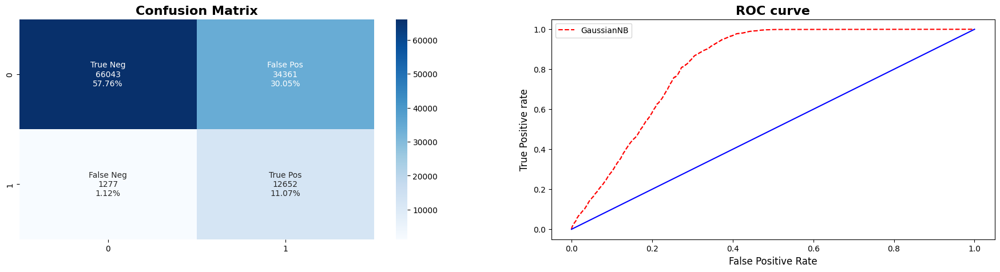

In [ ]:
parameters_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

ml_algorithm_implementation(dataset, GaussianNB(), parameters_NB, Tuning_Method, False)

## **AdaBoost Classifier**

The Boosting technique known as AdaBoost algorithm, sometimes known as Adaptive Boosting, is used as an Ensemble Method in machine learning. The weights are redistributed to each instance, with higher weights being given to instances that were mistakenly identified, hence the name "adaptive boosting."

## **Hyper-Parameter Tuning:**

**n_estimators**: The maximum number of estimators at which boosting is terminated. In case of perfect fit, the learning procedure is stopped early.

**learning_rate**: Weight applied to each classifier at each boosting iteration.

**random_state**: Controls the randomness of the estimator.

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
AdaBoostClassifier
--------------------------------------------------

Evaluation of AdaBoostClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



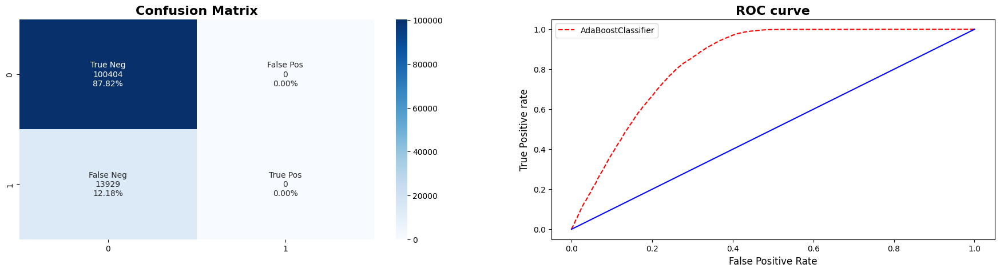

**************************************************
Best Score for AdaBoostClassifier : 0.9263492063492065 
---
Best Parameters for AdaBoostClassifier : {'random_state': 2, 'n_estimators': 10, 'learning_rate': 0.001}
--------------------------------------------------
Elapsed Time: 00:00:51

Evaluation of AdaBoostClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



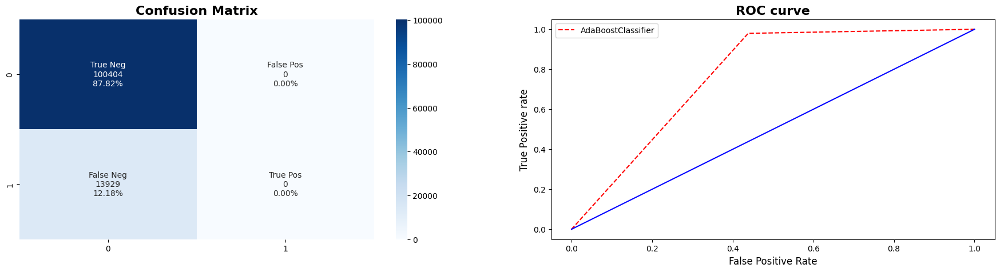

In [ ]:
parameters_ada = {'n_estimators':[10, 100, 200,400],
              'learning_rate':[0.001, 0.01, 0.1, 0.2, 0.5],
              'random_state':[2]}

ml_algorithm_implementation(dataset, AdaBoostClassifier(), parameters_ada, Tuning_Method, False)

## **Bagging Classifier**

A Bagging classifier is an ensemble meta-estimator that fits base classifiers each on random subsets of the original dataset and then aggregate their individual predictions (either by voting or by averaging) to form a final prediction

### **Hyperparameter-Tunning**

**n_estimators**: The maximum number of estimators at which boosting is terminated.

**random_state**: Controls the randomness of the estimator.

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
BaggingClassifier
--------------------------------------------------

Evaluation of BaggingClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.853131   0.299369  0.153349   0.20281        0.55178  5.293704



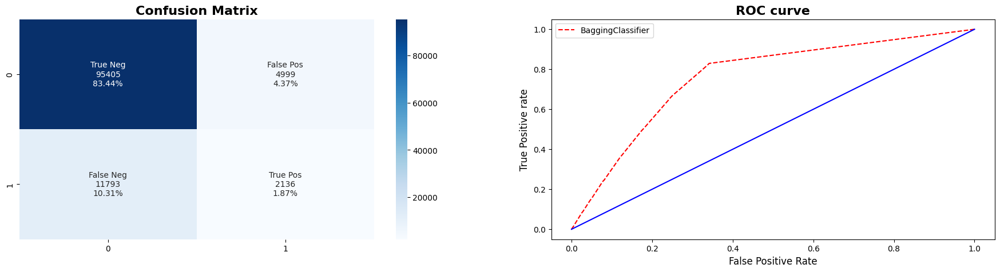

**************************************************
Best Score for BaggingClassifier : 0.8590909090909091 
---
Best Parameters for BaggingClassifier : {'random_state': 26, 'n_estimators': 200}
--------------------------------------------------
Elapsed Time: 00:05:15

Evaluation of BaggingClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.855737   0.312637  0.153636  0.206027       0.553388  5.199759



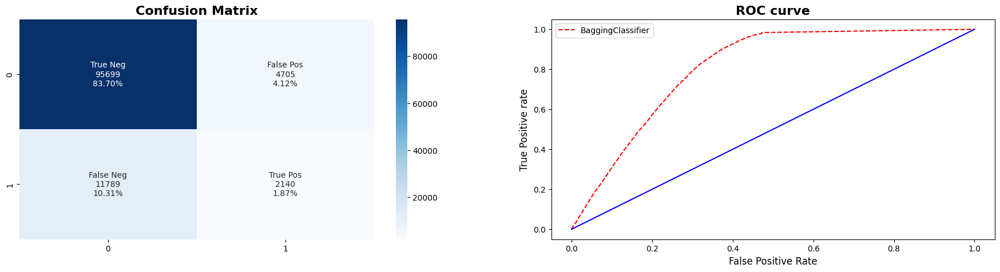

In [ ]:
parameters_bagging = {'n_estimators':[10, 100, 200, 400],
                      'random_state':[26]}

ml_algorithm_implementation(dataset, BaggingClassifier(), parameters_bagging, Tuning_Method, False)

## **LightGBMClassifier**

A distributed gradient boosting framework is known as LightGBM, or Light Gradient Boosting Machine.It is a fast algorithm since it makes use of Histogram-based Splitting, Gradient-based One-Side Sampling (GOSS), and Exclusive Feature Bundling (EFB).

### **Hyperparameter Tuning:**

**n_estimators**: Number of Boosting iterations.

**learning_rate**: This setting is used for reducing the gradient step. It affects the overall time of training: the smaller the value, the more iterations are required for training.

**min_data_in_leaf**: Minimal number of data in one leaf. Can be used to deal with over-fitting

**random_state**: Controls the randomness of the estimator.

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
LGBMClassifier
--------------------------------------------------

Evaluation of LGBMClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision   Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878163   0.485714  0.00122  0.002435       0.500521  4.391454



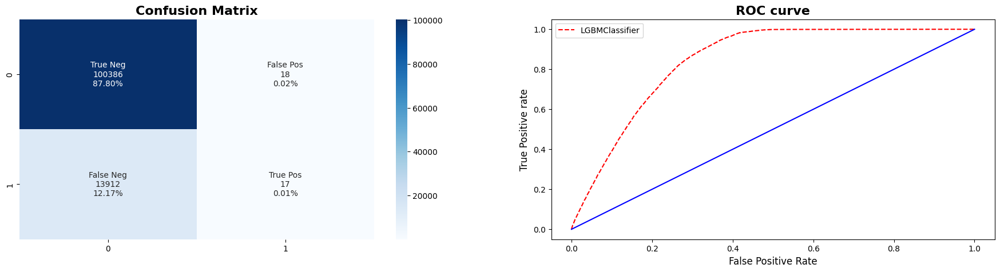

[LightGBM] [Warning] Unknown parameter: max_depths
[LightGBM] [Warning] min_data_in_leaf is set=250, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=250
**************************************************
Best Score for LGBMClassifier : 0.8751376094981964 
---
Best Parameters for LGBMClassifier : {'n_estimators': 100, 'min_data_in_leaf': 250, 'max_depths': 3.0, 'learning_rate': 0.001}
--------------------------------------------------
Elapsed Time: 00:03:52

Evaluation of LGBMClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



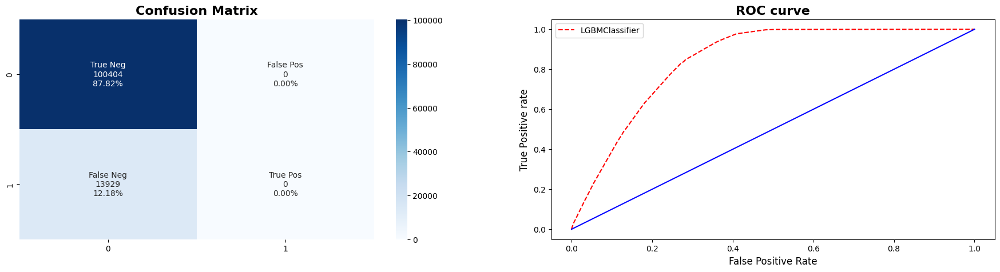

In [ ]:
parameters_lightgbm = {
    'max_depths': np.linspace(1, 32, 32, endpoint=True),
    'min_data_in_leaf':[100, 200, 250, 300],
    'n_estimators':[50,100, 120,150,200],
    'learning_rate':[.001,0.01,.1]
}

ml_algorithm_implementation(dataset, lgb.LGBMClassifier(), parameters_lightgbm, Tuning_Method, False)

## **Logistic Regression**

The logistic classification model is a binary classification model in which the conditional probability of one of the two possible realizations of the output variable is assumed to be equal to a linear combination of the input variables, transformed by the logistic function.

### **Hyperparameter Tunning**

**solver**: Algorithm to use in the optimization problem.

**penalty**: Specify the norm of the penalty.

**C**: Inverse of regularization strength

**random_state**: Controls the randomness of the estimator.

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
LogisticRegression
--------------------------------------------------

Evaluation of LogisticRegression before tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



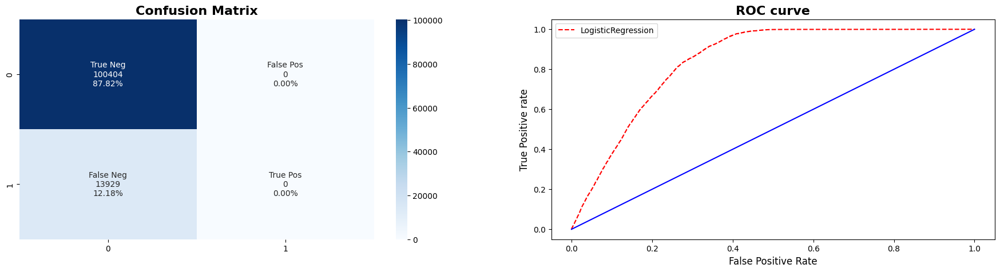

**************************************************
Best Score for LogisticRegression : 0.8824333679473867 
---
Best Parameters for LogisticRegression : {'solver': 'lbfgs', 'random_state': 2, 'penalty': 'l2', 'C': 0.01}
--------------------------------------------------
Elapsed Time: 00:00:04

Evaluation of LogisticRegression after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



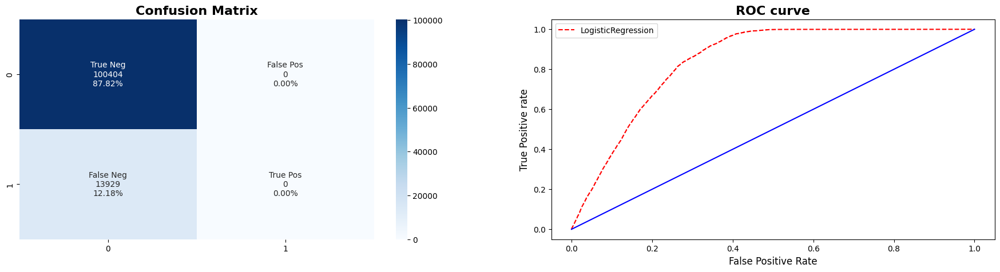

In [ ]:
parameters_logistic = {'solver' : ['newton-cg', 'lbfgs', 'liblinear','sag','saga'],
                        'penalty' : ['l2'],
                        'C' : [100, 10, 1.0, 0.1, 0.01, 0.001],
                       'random_state':[2]}

ml_algorithm_implementation(dataset, LogisticRegression(), parameters_logistic, Tuning_Method, False)

## **Best Model**

We can infer that Bagging Classifier is the best model for our data set from all the above models that we tried to train and forecast the results. "n_estimators": 200 is the model's ideal parameter. Its scores are 0.85 for Accuracy, 0.31 for Precision, 0.15 for Recall, 0.20 for F1, 0.55 for ROC_AUC, and 4.98 for Log Loss. It has 03 minutes and 21 seconds of elapsed time.

As can be seen, the Bagging Classifier does not have the highest Accuracy Score among our models. The issue with those models is that they have 0 Precision and Recall values, which implies that True Positives are also zero. This means that those algorithms cannot accurately forecast results if any buyer is prepared to purchase auto insurance.And as we all know,classification accuracy alone can be misleading if you had an unequal number of observations in each class.This is exactly the case with our data set.

Hence,it is proved that Bagging classifier is the top model for our dataset.

We might get a slight change in result everytime we run because we are using Halving_Randomized_Search_CV to perform hyperparameter tunning which randomely selects the combination of parameter to tune the model.

# **Extracting Feature Importance**

With the values of its hyperparameters, we obtained our best model. Let's have a look at the importance of each feature in our data collection.

In [ ]:
def feature_plot(importances, X_train, y_train):

    # Display the five most important features
    indices = np.argsort(importances)[::-1]
    columns = X_train.columns.values[indices[:5]]
    values = importances[indices][:5]

    # Creat the plot
    fig = plt.figure(figsize = (9,5))
    plt.title("Normalized Weights for First Five Most Predictive Features", fontsize = 16)
    plt.bar(np.arange(5), values, width = 0.2, align="center", color = '#00A000', \
          label = "Feature Weight")
    plt.bar(np.arange(5) - 0.2, np.cumsum(values), width = 0.2, align = "center", color = '#00A0A0', \
          label = "Cumulative Feature Weight")
    plt.xticks(np.arange(5), columns)
    plt.xlim((-0.5, 4.5))
    plt.ylabel("Weight", fontsize = 14)
    plt.xlabel("Feature", fontsize = 14)

    plt.legend(loc = 'upper center')
    plt.tight_layout()
    plt.show()

def show_feature_importance():
    x_train, y_train, model = ml_algorithm_implementation(dataset, BaggingClassifier(n_estimators=200, random_state=23),
                                None, None, True)

    importances = np.mean([
        tree.feature_importances_ for tree in model.estimators_
        ], axis=0)
    feature_plot(importances, x_train, y_train)

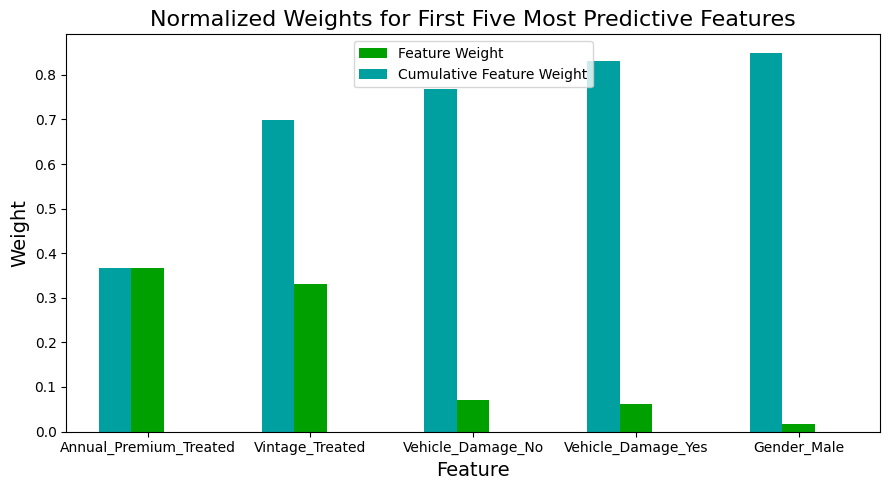

In [ ]:
show_feature_importance()

### **Observations:**

* Annual_Premium_Treated has most impacted predictions
* Gender_Male has highest feature weight but less cumulative weight

## **Conclusion**

We started by looking for duplicates and null values after loading our dataset. Duplicates and null values weren't present, hence their treatment wasn't necessary. Before processing the data, we used feature scaling techniques to standardize the data and make it easier for ML algorithms to analyze.

Through exploratory data analysis, we divided Age into three categories: young, middle-aged, and old, and we divided Region_Code into three categories: region_A, region_B, and region_C. The Policy Sales Channel was divided into channels A, B, and C. Further,we observed that youngAge customers are more interested in vehicle reaction. Customers with vehicles older than two years are more likely to be interested in auto insurance, according to our observation. Customers who have damaged cars are also more likely to be interested in auto insurance.

For feature selection, we employed the Mutual Information approach for categorical features and Kendall's rank correlation coefficient for numerical features.Here, we observed that the dependent feature is mainly affected by the significant feature, Previously_Insured, and that there is no link between the two numerical features.

Further, we applied Machine Learning Algorithms to determine whether a customer would be interested in Vehicle Insurance. For the Naive Bayes algorithm, we got an accuracy score of 68% and after hyperparameter tuning, the accuracy score increased to 72%. Similarly, for Decision Tree Classifier, AdaBoost, BaggingClassifier, LightGBM accuracy score was obtained around 82%-87%. So, we selected our best model as the model with an accuracy score of 85% considering precision and recall as we have an unequal number of observations in each class in our dataset, so accuracy alone can be deceiving.